## Rainfall Weather Forecasting

#### Importing libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

#### Reading Data

In [2]:
df = pd.read_csv(r"C:\Users\HP\Downloads\Rainfall.csv",encoding="utf-8")
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [3]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [4]:
df.shape

(8425, 23)

In [5]:
## Drpoing null value
df=df.drop_duplicates()
df.shape

(6762, 23)

* Dataset have 20% duplicate data

In [6]:
### Removing white space from dataset
import re
for i in df.select_dtypes("O").columns.tolist():
    df[i].str.replace(" ","",regex=True)

In [7]:
df.head(3)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6762 non-null   object 
 1   Location       6762 non-null   object 
 2   MinTemp        6692 non-null   float64
 3   MaxTemp        6705 non-null   float64
 4   Rainfall       6624 non-null   float64
 5   Evaporation    3841 non-null   float64
 6   Sunshine       3526 non-null   float64
 7   WindGustDir    5820 non-null   object 
 8   WindGustSpeed  5820 non-null   float64
 9   WindDir9am     5968 non-null   object 
 10  WindDir3pm     6468 non-null   object 
 11  WindSpeed9am   6699 non-null   float64
 12  WindSpeed3pm   6662 non-null   float64
 13  Humidity9am    6708 non-null   float64
 14  Humidity3pm    6666 non-null   float64
 15  Pressure9am    5454 non-null   float64
 16  Pressure3pm    5451 non-null   float64
 17  Cloud9am       4896 non-null   float64
 18  Cloud3pm

* Date has invalid dtype

In [9]:
### Making copy of data set
data = df.copy()

In [10]:
for i in df.select_dtypes(np.number).columns.tolist():
    data[i].fillna(0,inplace=True)
    
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,0.0,0.0,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,0.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,0.0,0.0,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,0.0,0.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,0.0,0.0,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,0.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,0.0,0.0,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,0.0,0.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,0.0,0.0,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [11]:
for i in df.select_dtypes(np.number).columns.tolist():
    data[i] = np.where(data[i]==0.0,0,1)
    
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,1,1,1,0,0,W,1,W,...,1,1,1,1,1,0,1,1,No,No
1,2008-12-02,Albury,1,1,0,0,0,WNW,1,NNW,...,1,1,1,1,0,0,1,1,No,No
2,2008-12-03,Albury,1,1,0,0,0,WSW,1,W,...,1,1,1,1,0,1,1,1,No,No
3,2008-12-04,Albury,1,1,0,0,0,NE,1,SE,...,1,1,1,1,0,0,1,1,No,No
4,2008-12-05,Albury,1,1,1,0,0,W,1,ENE,...,1,1,1,1,1,1,1,1,No,No


In [12]:
data["RainTomorrow"].dropna(inplace=True)
data.shape

(6762, 23)

In [13]:
col_int = df.select_dtypes(np.number).columns.tolist()

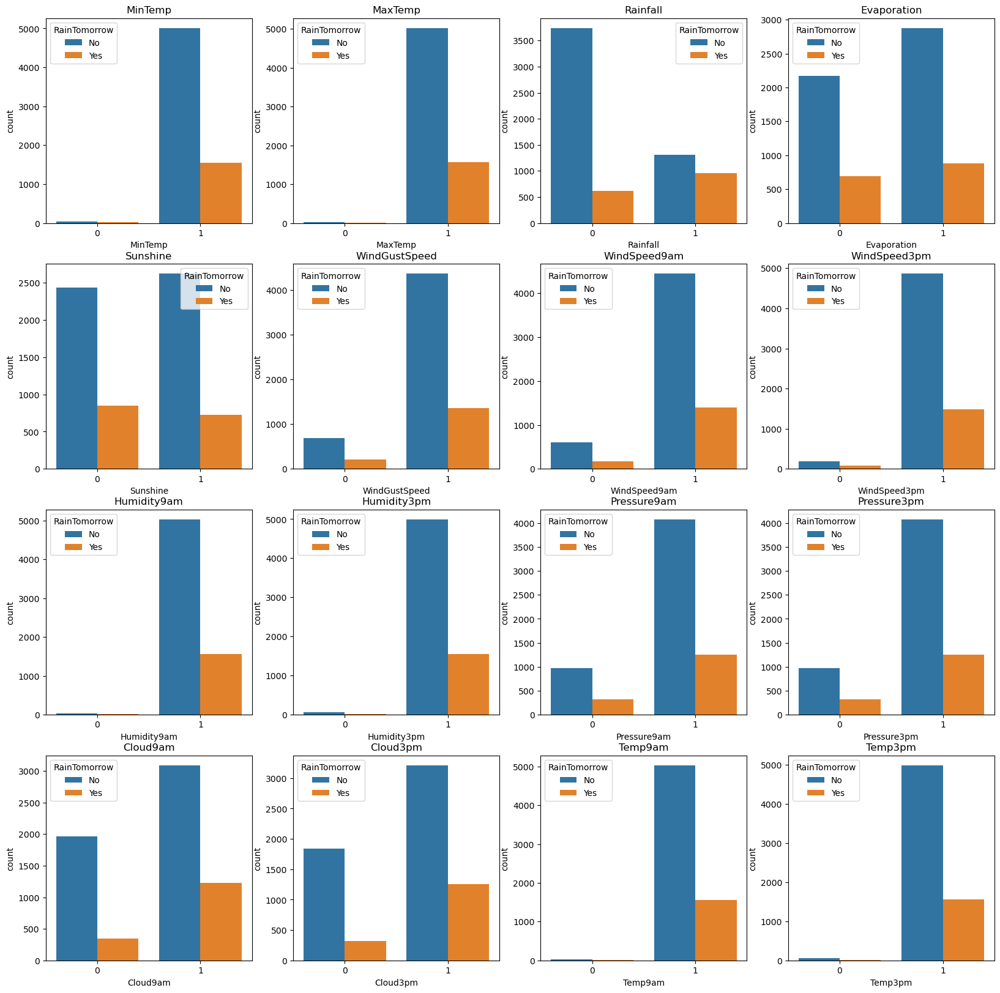

In [14]:
plt.figure(figsize=(20,20))
num = 1
for i in col_int:
    if num<= len(col_int):
        ax = plt.subplot(4,4,num)
        sns.countplot(data=data,x=data[i],hue="RainTomorrow")
        plt.title(i)
        num+=1
plt.show()

In [15]:
df.isna().sum()/len(df) * 100

Date              0.000000
Location          0.000000
MinTemp           1.035197
MaxTemp           0.842946
Rainfall          2.040816
Evaporation      43.197279
Sunshine         47.855664
WindGustDir      13.930790
WindGustSpeed    13.930790
WindDir9am       11.742088
WindDir3pm        4.347826
WindSpeed9am      0.931677
WindSpeed3pm      1.478852
Humidity9am       0.798580
Humidity3pm       1.419698
Pressure9am      19.343390
Pressure3pm      19.387755
Cloud9am         27.595386
Cloud3pm         28.127773
Temp9am           0.754215
Temp3pm           1.360544
RainToday         2.040816
RainTomorrow      2.040816
dtype: float64

In [16]:
df.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

* Handling missing value in numerical value by median
* Handling missing value in categorical value by mode

In [17]:
print(df["WindGustDir"].mode())
print(df["WindDir9am"].mode())
print(df["WindDir3pm"].mode())

0    E
Name: WindGustDir, dtype: object
0    N
Name: WindDir9am, dtype: object
0    SE
Name: WindDir3pm, dtype: object


In [18]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [19]:
df["Date"] = pd.to_datetime(df["Date"])

In [20]:
df['month'] = df['Date'].dt.month
df['year'] = df['Date'].dt.year
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,month,year
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,12,2008
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,12,2008
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,12,2008
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,12,2008
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,12,2008


In [21]:
### Droping the date 
df.drop("Date",axis=1,inplace=True)
df.shape

(6762, 24)

In [22]:
df["WindGustDir"].fillna("E",inplace=True)
df["WindDir9am"].fillna("N",inplace=True)
df["WindDir3pm"].fillna("SE",inplace=True)

##### Lebale Encoding

In [23]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()
for i in df.select_dtypes("O").columns.tolist():
    df[i] = lb.fit_transform(df[i])

##### Handaling Missing value

In [24]:
from sklearn.impute import KNNImputer
imp = KNNImputer(n_neighbors=3)

df_new = imp.fit_transform(df)
df = pd.DataFrame(df_new,columns=df.columns)

In [25]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,month,year
0,1.0,13.4,22.9,0.6,7.400000,6.900000,13.0,44.0,13.0,14.0,...,1007.7,1007.1,8.000000,2.666667,16.9,21.8,0.0,0.0,12.0,2008.0
1,1.0,7.4,25.1,0.0,4.800000,10.066667,14.0,44.0,6.0,15.0,...,1010.6,1007.8,2.666667,3.666667,17.2,24.3,0.0,0.0,12.0,2008.0
2,1.0,12.9,25.7,0.0,7.066667,11.433333,15.0,46.0,13.0,15.0,...,1007.6,1008.7,2.333333,2.000000,21.0,23.2,0.0,0.0,12.0,2008.0
3,1.0,9.2,28.0,0.0,4.800000,11.200000,4.0,24.0,9.0,0.0,...,1017.6,1012.8,0.666667,0.666667,18.1,26.5,0.0,0.0,12.0,2008.0
4,1.0,17.5,32.3,1.0,3.266667,9.200000,13.0,41.0,1.0,7.0,...,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0,12.0,2008.0


#### Exploratory data analysis

##### Visualizing outliers

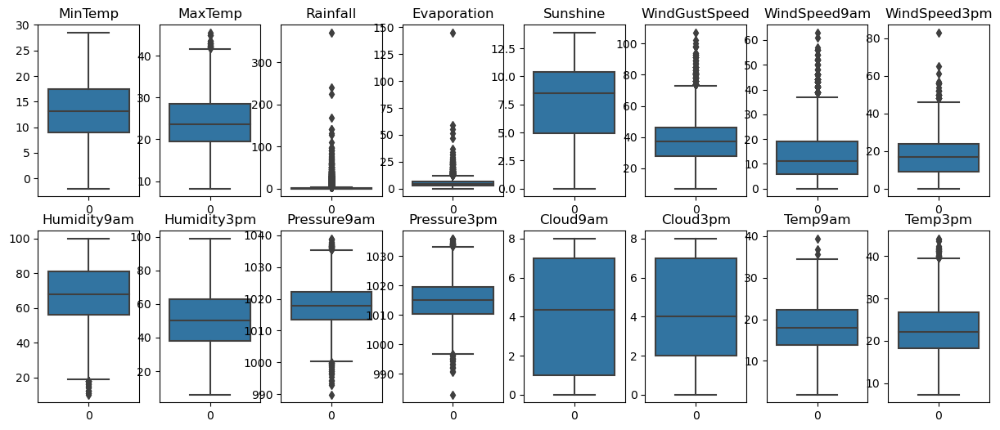

In [26]:
plt.figure(figsize=(15,6))
num = 1
for i in col_int:
    if num <= len(col_int):
        ax = plt.subplot(2,8,num)
        sns.boxplot(df[i])
        plt.title(i)
        num +=1
plt.show()

In [27]:
from scipy.stats import zscore

z = np.abs(zscore(df))
z.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,month,year
0,1.395097,0.051628,0.196267,0.209231,0.659646,0.184573,1.220923,0.413371,1.315650,1.372365,...,1.567238,1.251207,1.407513,0.592796,0.174256,0.148174,0.55853,0.55853,1.639768,1.761148
1,1.395097,1.027135,0.161822,0.266293,0.009662,0.698267,1.412005,0.413371,0.222688,1.595253,...,1.117167,1.142136,0.549684,0.199730,0.121952,0.268656,0.55853,0.55853,1.639768,1.761148
2,1.395097,0.038269,0.259482,0.266293,0.573837,1.079282,1.603087,0.552269,1.315650,1.595253,...,1.582757,1.001902,0.672008,0.854840,0.540560,0.085251,0.55853,0.55853,1.639768,1.761148
3,1.395097,0.703507,0.633848,0.266293,0.009662,1.014231,0.498814,0.975603,0.436600,1.748064,...,0.030790,0.363060,1.283632,1.378928,0.034958,0.635466,0.55853,0.55853,1.639768,1.761148
4,1.395097,0.788782,1.333749,0.171190,0.404382,0.456647,1.220923,0.205025,1.321500,0.187849,...,1.086128,1.422603,1.040538,1.503556,0.017345,1.169009,0.55853,0.55853,1.639768,1.761148


In [28]:
np.where(z>3)

(array([  12,   12,   14,   15,   44,   44,   52,   52,   60,   60,   61,
          61,   62,   62,   62,   67,   68,   68,  123,  267,  283,  284,
         296,  348,  350,  381,  381,  405,  406,  407,  431,  435,  436,
         437,  438,  443,  444,  452,  453,  455,  456,  462,  464,  465,
         563,  568,  568,  611,  612,  683,  683,  699,  713,  748,  770,
         796,  797,  802,  928,  928,  928,  929,  935,  949,  979,  980,
         980,  980, 1008, 1009, 1011, 1138, 1148, 1149, 1151, 1151, 1189,
        1203, 1237, 1241, 1264, 1265, 1357, 1411, 1412, 1413, 1479, 1480,
        1481, 1513, 1535, 1587, 1644, 1661, 1665, 1673, 1680, 1774, 1811,
        1812, 1812, 1813, 1813, 1814, 1814, 1815, 1815, 1816, 1816, 1817,
        1817, 1818, 1819, 1873, 1898, 1903, 1945, 2016, 2028, 2040, 2043,
        2068, 2069, 2074, 2108, 2116, 2163, 2164, 2164, 2165, 2165, 2166,
        2166, 2167, 2186, 2198, 2199, 2199, 2200, 2201, 2219, 2219, 2219,
        2230, 2231, 2265, 2429, 2459, 

In [29]:
print(z.iloc[12,14])

3.646874313919911


In [30]:
df = df[(z<3).all(axis=1)]
df.shape

(6255, 24)

##### visualizing skewness

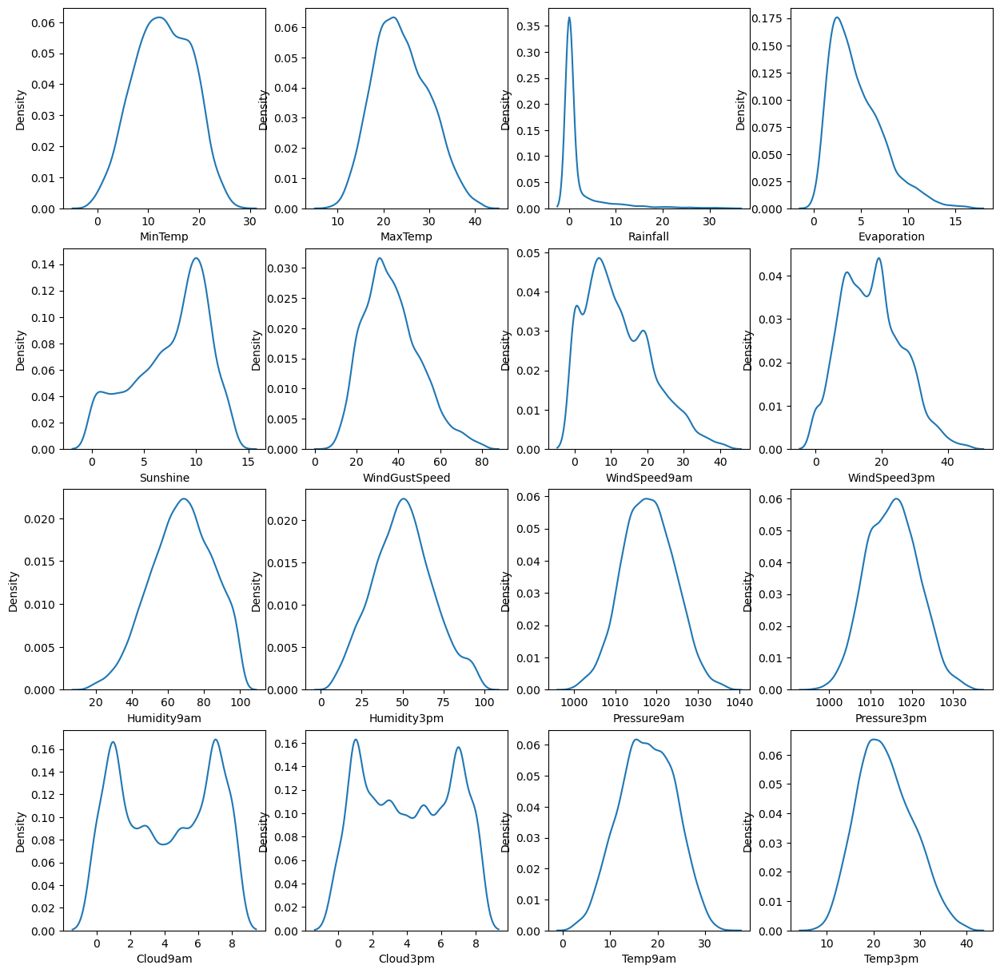

In [31]:
plt.figure(figsize=(15,15))
num = 1
for i in col_int:
    if num <= len(col_int):
        ax = plt.subplot(4,4,num)
        sns.kdeplot(x = df[i])
        num +=1
plt.show()

* Rainfall , WindSpeed9am ,WindSpeed3pm and Evaporation have skewness 

In [32]:
### Removing Sekwness
for i in ["Rainfall" , "WindSpeed9am" ,"WindSpeed3pm" ,"Evaporation"]:
    df[i] = np.sqrt(df[i])

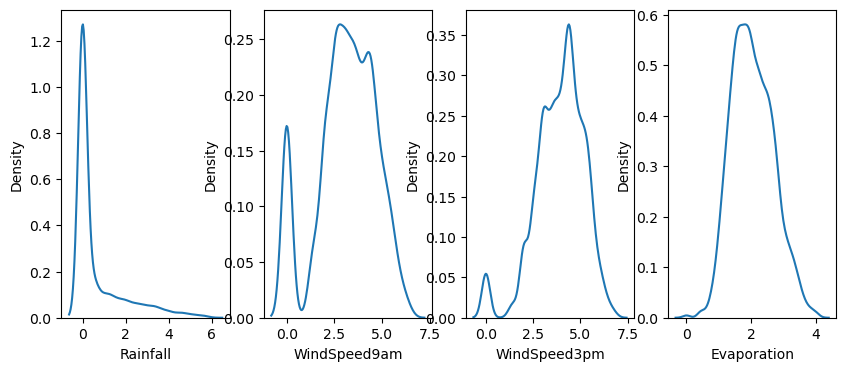

In [33]:
plt.figure(figsize=(10,4))
num =1
for i in ["Rainfall" , "WindSpeed9am" ,"WindSpeed3pm" , "Evaporation"]:
    if num<=4:
        ax = plt.subplot(1,4,num)
        sns.kdeplot(df[i])
        num+=1
plt.show()

* Rainfall, Evaporation has still sekwness

In [34]:
for i in ["Rainfall", "Evaporation"]:
    df[i] = np.sqrt(df[i])

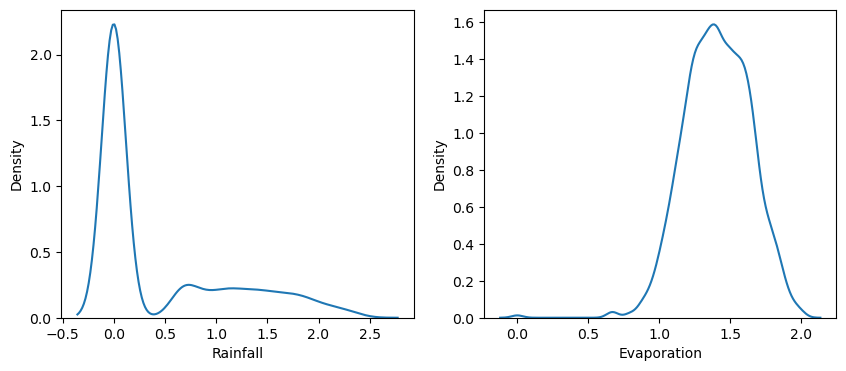

In [35]:
plt.figure(figsize=(10,4))
num =1
for i in ["Rainfall","Evaporation"]:
    if num<=2:
        ax = plt.subplot(1,2,num)
        sns.kdeplot(df[i])
        num+=1
plt.show()

<Axes: >

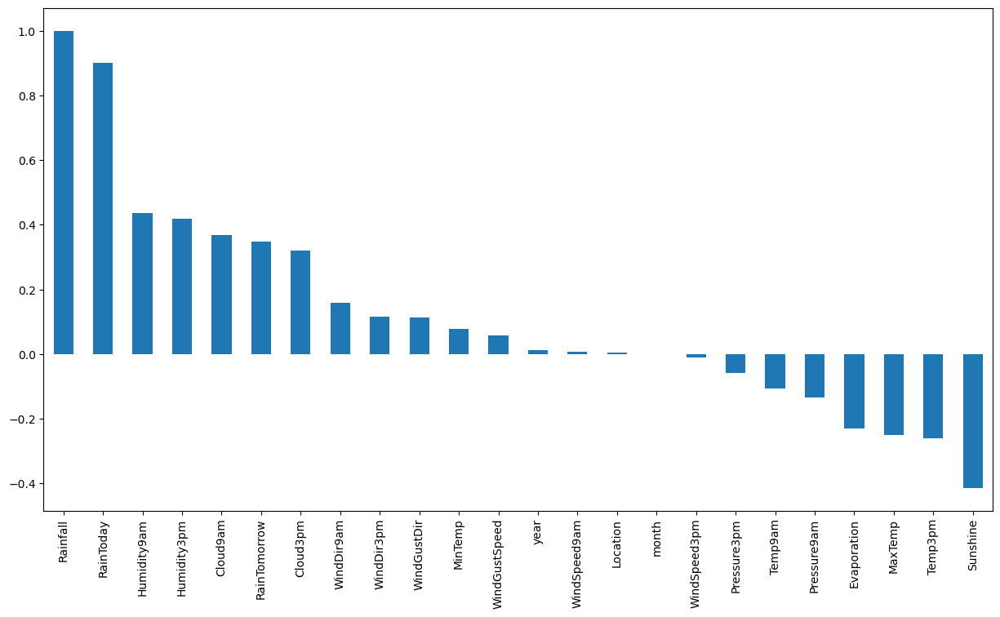

In [36]:
### Vizualizing which feature how correleted
plt.figure(figsize=(15,8))
corr = df.corr()["Rainfall"].sort_values(ascending=[False])
corr.plot.bar()

<Axes: >

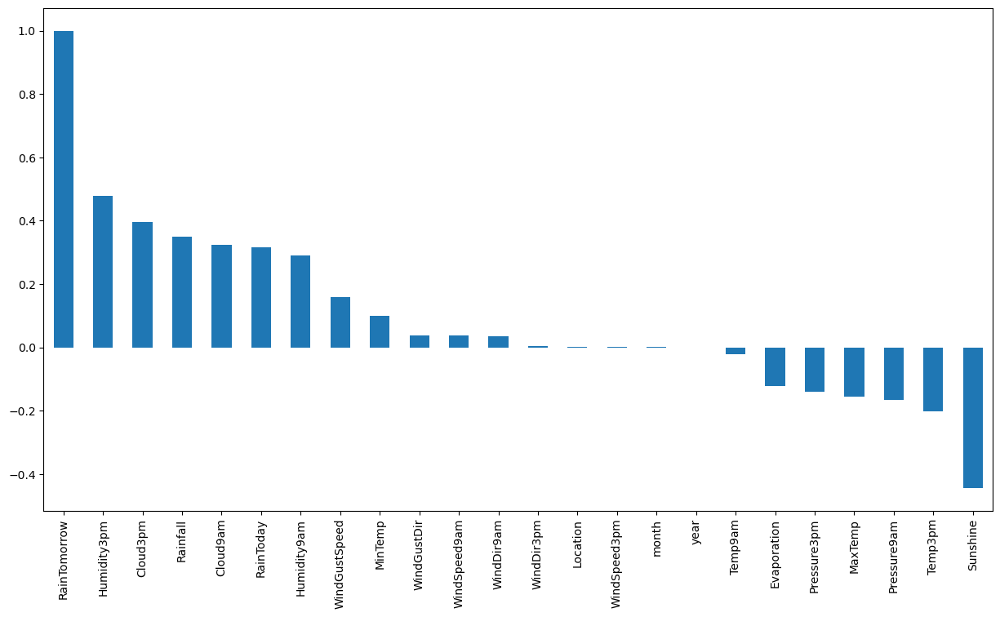

In [37]:
### Vizualizing which feature how correleted
plt.figure(figsize=(15,8))
corr = df.corr()["RainTomorrow"].sort_values(ascending=[False])
corr.plot.bar()

<Axes: >

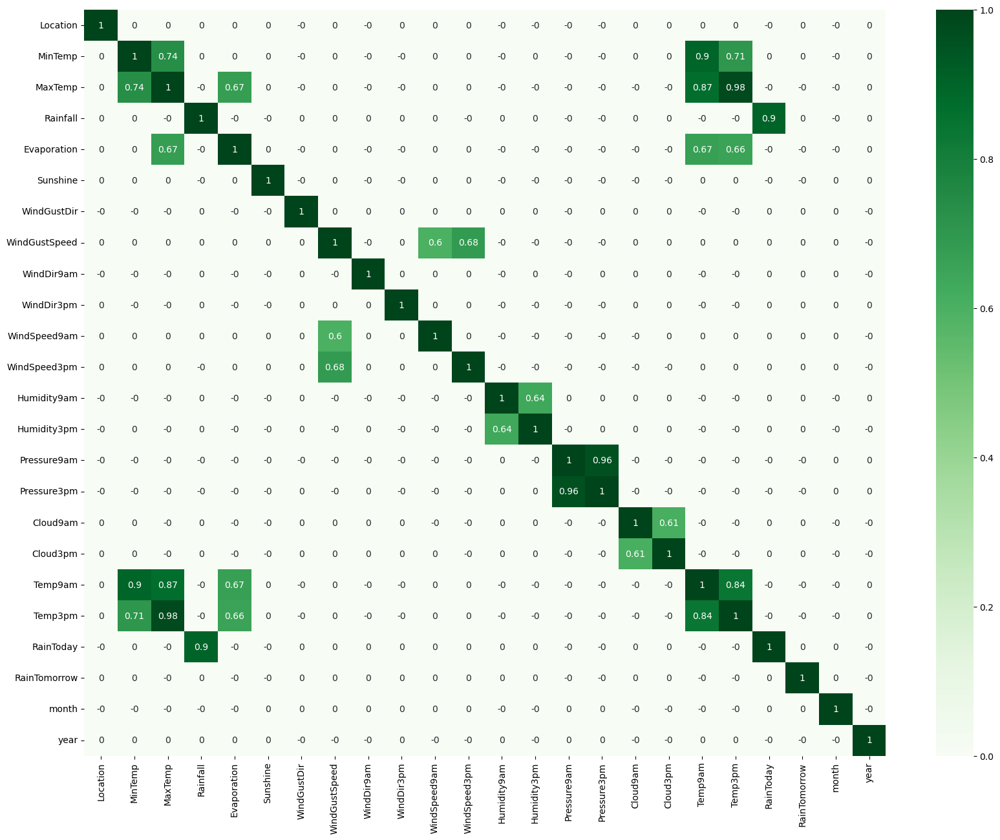

In [38]:
plt.figure(figsize=(20,15))
corr = (df.corr() > 0.6 )* df.corr()
sns.heatmap(corr,annot=True,cmap="Greens")

1. Temp9am ,Temp3pm and MinTemp, Maxtemp , Evaporation have strong correletion
2. Pressure9am and Pressure3pm have strong correletion
3. cloud3pm and cloud9am have correletion
4. WindGustSpeed  have correletion with WindGust9am and WindGust3pm 
5. MinTemp and MaxTemp have strong correletion
6. Evaporation and have MaxTemp correletion

* spliting data into input and target variable

In [39]:
x = df.drop(["Rainfall","RainTomorrow"],axis=1)
x.head(3)

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,month,year
0,1.0,13.4,22.9,1.649331,6.900000,13.0,44.0,13.0,14.0,4.472136,...,22.0,1007.7,1007.1,8.000000,2.666667,16.9,21.8,0.0,12.0,2008.0
1,1.0,7.4,25.1,1.480166,10.066667,14.0,44.0,6.0,15.0,2.000000,...,25.0,1010.6,1007.8,2.666667,3.666667,17.2,24.3,0.0,12.0,2008.0
2,1.0,12.9,25.7,1.630436,11.433333,15.0,46.0,13.0,15.0,4.358899,...,30.0,1007.6,1008.7,2.333333,2.000000,21.0,23.2,0.0,12.0,2008.0


In [40]:
y = df.loc[:,"RainTomorrow"]
y.head(3)

0    0.0
1    0.0
2    0.0
Name: RainTomorrow, dtype: float64

##### Removing multicoliniarity

In [41]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def vif(x):
    vif = pd.DataFrame()
    vif["ver"] = x.columns
    vif["VIF"] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return vif

In [42]:
vif(x)

,ver,VIF
0,Location,4.517297
1,MinTemp,61.516056
2,MaxTemp,576.927363
3,Evaporation,91.658632
4,Sunshine,21.628995
5,WindGustDir,4.091741
6,WindGustSpeed,23.984989
7,WindDir9am,4.670267
8,WindDir3pm,5.740969
9,WindSpeed9am,10.640732


In [43]:
x.drop(["Pressure9am","Temp3pm","MaxTemp","WindGustSpeed","year"],axis=1,inplace=True)
vif(x)

,ver,VIF
0,Location,4.470999
1,MinTemp,59.527565
2,Evaporation,86.938097
3,Sunshine,21.176491
4,WindGustDir,3.975205
5,WindDir9am,4.327385
6,WindDir3pm,5.307805
7,WindSpeed9am,9.483086
8,WindSpeed3pm,16.584224
9,Humidity9am,54.229290


### Feature selection

In [44]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

In [45]:
feature_sel_model = SelectFromModel(Lasso(alpha=0.005,random_state=0))
feature_sel_model.fit(x,y)

SelectFromModel(estimator=Lasso(alpha=0.005, random_state=0))

In [46]:
feature_sel_model.get_support()

array([ True, False, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False,  True,  True])

In [47]:
selected_feat = x.columns[(feature_sel_model.get_support())]

print("total Feature: {}".format(x.shape[1]))
print('feature selected: {}'.format(len(selected_feat)))

total Feature: 17
feature selected: 14


In [48]:
selected_feat

Index(['Location', 'Sunshine', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'RainToday', 'month'],
      dtype='object')

In [49]:
x = x[selected_feat]
x.head()

,Location,Sunshine,WindGustDir,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,month
0,1.0,6.900000,13.0,13.0,14.0,4.472136,4.898979,71.0,22.0,1007.1,8.000000,2.666667,0.0,12.0
1,1.0,10.066667,14.0,6.0,15.0,2.000000,4.690416,44.0,25.0,1007.8,2.666667,3.666667,0.0,12.0
2,1.0,11.433333,15.0,13.0,15.0,4.358899,5.099020,38.0,30.0,1008.7,2.333333,2.000000,0.0,12.0
3,1.0,11.200000,4.0,9.0,0.0,3.316625,3.000000,45.0,16.0,1012.8,0.666667,0.666667,0.0,12.0
4,1.0,9.200000,13.0,1.0,7.0,2.645751,4.472136,82.0,33.0,1006.0,7.000000,8.000000,0.0,12.0


In [50]:
col = ['Location', 'Sunshine', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'RainToday', 'month',"RainTomorrow"]

<Figure size 2000x2000 with 0 Axes>

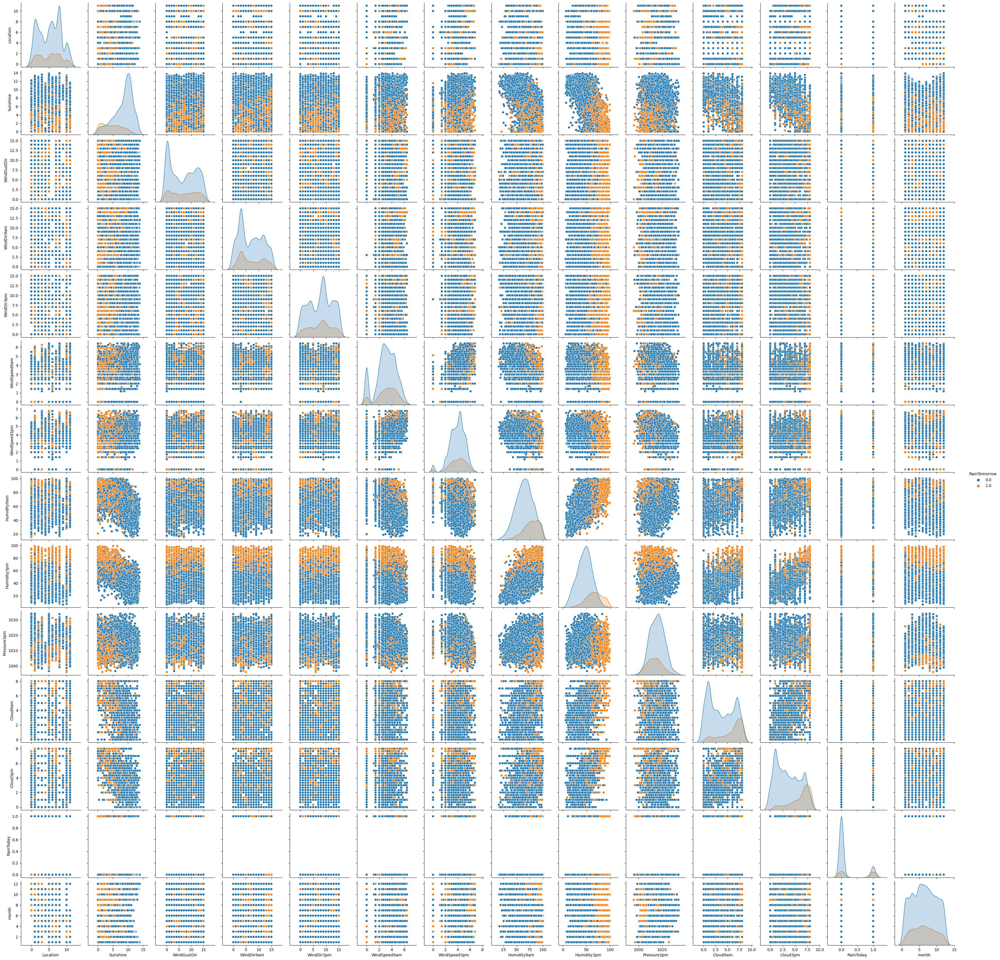

In [51]:
plt.figure(figsize=(20,20))
sns.pairplot(df.loc[:,col],hue="RainTomorrow")

#### splting data into train and test

In [52]:
from sklearn.model_selection import train_test_split

In [53]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [54]:
print("x_train:",x_train.shape,"|","y_train:",y_train.shape)
print("x_test:",x_test.shape,"|","y_test:",y_test.shape)
print(y_train.value_counts())

x_train: (5004, 14) | y_train: (5004,)
x_test: (1251, 14) | y_test: (1251,)
0.0    3897
1.0    1107
Name: RainTomorrow, dtype: int64


In [55]:
from imblearn.over_sampling import SMOTE
smt = SMOTE()
x_train,y_train = smt.fit_resample(x_train,y_train)

In [56]:
y_train.value_counts()

0.0    3897
1.0    3897
Name: RainTomorrow, dtype: int64

### Model Building

#### LogisticRegression

In [60]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

In [61]:
lg = LogisticRegression()
lg.fit(x_train,y_train)

LogisticRegression()

In [62]:
y_train_pred = lg.predict(x_train)
y_test_pred = lg.predict(x_test)

In [63]:
print("<-------------------train------------------------->")
print("accuracy_score:" , accuracy_score(y_train,y_train_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_train,y_train_pred))
print("\nclassification_report:\n",classification_report(y_train,y_train_pred))

print("<-------------------test------------------------->")
print("accuracy_score:" , accuracy_score(y_test,y_test_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_test,y_test_pred))
print("\nclassification_report:\n",classification_report(y_test,y_test_pred))

<-------------------train------------------------->
accuracy_score: 0.7634077495509366

confusion_matrix:
 [[2992  905]
 [ 939 2958]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.76      0.77      0.76      3897
         1.0       0.77      0.76      0.76      3897

    accuracy                           0.76      7794
   macro avg       0.76      0.76      0.76      7794
weighted avg       0.76      0.76      0.76      7794

<-------------------test------------------------->
accuracy_score: 0.7761790567545963

confusion_matrix:
 [[738 208]
 [ 72 233]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.91      0.78      0.84       946
         1.0       0.53      0.76      0.62       305

    accuracy                           0.78      1251
   macro avg       0.72      0.77      0.73      1251
weighted avg       0.82      0.78      0.79      1251



#### knn

In [64]:
from sklearn.neighbors import KNeighborsClassifier

In [65]:
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [66]:
y_train_pred = knn.predict(x_train)
y_test_pred = knn.predict(x_test)

In [67]:
print("<-------------------train------------------------->")
print("accuracy_score:" , accuracy_score(y_train,y_train_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_train,y_train_pred))
print("\nclassification_report:\n",classification_report(y_train,y_train_pred))

print("<-------------------test------------------------->")
print("accuracy_score:" , accuracy_score(y_test,y_test_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_test,y_test_pred))
print("\nclassification_report:\n",classification_report(y_test,y_test_pred))

<-------------------train------------------------->
accuracy_score: 0.8967154221195791

confusion_matrix:
 [[3151  746]
 [  59 3838]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.98      0.81      0.89      3897
         1.0       0.84      0.98      0.91      3897

    accuracy                           0.90      7794
   macro avg       0.91      0.90      0.90      7794
weighted avg       0.91      0.90      0.90      7794

<-------------------test------------------------->
accuracy_score: 0.7330135891286971

confusion_matrix:
 [[698 248]
 [ 86 219]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.89      0.74      0.81       946
         1.0       0.47      0.72      0.57       305

    accuracy                           0.73      1251
   macro avg       0.68      0.73      0.69      1251
weighted avg       0.79      0.73      0.75      1251



#### svc

In [68]:
from sklearn.svm import SVC

In [69]:
svc= SVC()
svc.fit(x_train,y_train)

SVC()

In [70]:
y_train_pred = svc.predict(x_train)
y_test_pred = svc.predict(x_test)

In [71]:
print("<-------------------train------------------------->")
print("accuracy_score:" , accuracy_score(y_train,y_train_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_train,y_train_pred))
print("\nclassification_report:\n",classification_report(y_train,y_train_pred))

print("<-------------------test------------------------->")
print("accuracy_score:" , accuracy_score(y_test,y_test_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_test,y_test_pred))
print("\nclassification_report:\n",classification_report(y_test,y_test_pred))

<-------------------train------------------------->
accuracy_score: 0.7405696689761355

confusion_matrix:
 [[2952  945]
 [1077 2820]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.73      0.76      0.74      3897
         1.0       0.75      0.72      0.74      3897

    accuracy                           0.74      7794
   macro avg       0.74      0.74      0.74      7794
weighted avg       0.74      0.74      0.74      7794

<-------------------test------------------------->
accuracy_score: 0.7745803357314148

confusion_matrix:
 [[737 209]
 [ 73 232]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.91      0.78      0.84       946
         1.0       0.53      0.76      0.62       305

    accuracy                           0.77      1251
   macro avg       0.72      0.77      0.73      1251
weighted avg       0.82      0.77      0.79      1251



#### RandomForestClassifier

In [72]:
from sklearn.ensemble import RandomForestClassifier

In [73]:
rfc = RandomForestClassifier()
rfc.fit(x_train,y_train)

RandomForestClassifier()

In [74]:
y_train_pred = rfc.predict(x_train)
y_test_pred = rfc.predict(x_test)

In [75]:
print("<-------------------train------------------------->")
print("accuracy_score:" , accuracy_score(y_train,y_train_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_train,y_train_pred))
print("\nclassification_report:\n",classification_report(y_train,y_train_pred))

print("<-------------------test------------------------->")
print("accuracy_score:" , accuracy_score(y_test,y_test_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_test,y_test_pred))
print("\nclassification_report:\n",classification_report(y_test,y_test_pred))

<-------------------train------------------------->
accuracy_score: 1.0

confusion_matrix:
 [[3897    0]
 [   0 3897]]

classification_report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      3897
         1.0       1.00      1.00      1.00      3897

    accuracy                           1.00      7794
   macro avg       1.00      1.00      1.00      7794
weighted avg       1.00      1.00      1.00      7794

<-------------------test------------------------->
accuracy_score: 0.8401278976818545

confusion_matrix:
 [[865  81]
 [119 186]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.88      0.91      0.90       946
         1.0       0.70      0.61      0.65       305

    accuracy                           0.84      1251
   macro avg       0.79      0.76      0.77      1251
weighted avg       0.83      0.84      0.84      1251



#### AdaBoostClassifier

In [76]:
from sklearn.ensemble import AdaBoostClassifier

In [77]:
ada = AdaBoostClassifier()
ada.fit(x_train,y_train)

AdaBoostClassifier()

In [78]:
y_train_pred = ada.predict(x_train)
y_test_pred = ada.predict(x_test)

In [79]:
print("<-------------------train------------------------->")
print("accuracy_score:" , accuracy_score(y_train,y_train_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_train,y_train_pred))
print("\nclassification_report:\n",classification_report(y_train,y_train_pred))

print("<-------------------test------------------------->")
print("accuracy_score:" , accuracy_score(y_test,y_test_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_test,y_test_pred))
print("\nclassification_report:\n",classification_report(y_test,y_test_pred))

<-------------------train------------------------->
accuracy_score: 0.8415447780343854

confusion_matrix:
 [[3303  594]
 [ 641 3256]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.84      0.85      0.84      3897
         1.0       0.85      0.84      0.84      3897

    accuracy                           0.84      7794
   macro avg       0.84      0.84      0.84      7794
weighted avg       0.84      0.84      0.84      7794

<-------------------test------------------------->
accuracy_score: 0.7993605115907274

confusion_matrix:
 [[795 151]
 [100 205]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.89      0.84      0.86       946
         1.0       0.58      0.67      0.62       305

    accuracy                           0.80      1251
   macro avg       0.73      0.76      0.74      1251
weighted avg       0.81      0.80      0.80      1251



#### GradientBoostingClassifier

In [80]:
from sklearn.ensemble import GradientBoostingClassifier

In [81]:
gbc = GradientBoostingClassifier()
gbc.fit(x_train,y_train)

GradientBoostingClassifier()

In [82]:
y_train_pred = gbc.predict(x_train)
y_test_pred = gbc.predict(x_test)

In [83]:
print("<-------------------train------------------------->")
print("accuracy_score:" , accuracy_score(y_train,y_train_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_train,y_train_pred))
print("\nclassification_report:\n",classification_report(y_train,y_train_pred))

print("<-------------------test------------------------->")
print("accuracy_score:" , accuracy_score(y_test,y_test_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_test,y_test_pred))
print("\nclassification_report:\n",classification_report(y_test,y_test_pred))

<-------------------train------------------------->
accuracy_score: 0.8850397741852707

confusion_matrix:
 [[3488  409]
 [ 487 3410]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.88      0.90      0.89      3897
         1.0       0.89      0.88      0.88      3897

    accuracy                           0.89      7794
   macro avg       0.89      0.89      0.89      7794
weighted avg       0.89      0.89      0.89      7794

<-------------------test------------------------->
accuracy_score: 0.8361310951239008

confusion_matrix:
 [[843 103]
 [102 203]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.89      0.89      0.89       946
         1.0       0.66      0.67      0.66       305

    accuracy                           0.84      1251
   macro avg       0.78      0.78      0.78      1251
weighted avg       0.84      0.84      0.84      1251



#### XGBOOSTClassifier

In [84]:
from xgboost import XGBClassifier

In [85]:
xgc = XGBClassifier()
xgc.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [86]:
y_train_pred = xgc.predict(x_train)
y_test_pred = xgc.predict(x_test)

In [87]:
print("<-------------------train------------------------->")
print("accuracy_score:" , accuracy_score(y_train,y_train_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_train,y_train_pred))
print("\nclassification_report:\n",classification_report(y_train,y_train_pred))

print("<-------------------test------------------------->")
print("accuracy_score:" , accuracy_score(y_test,y_test_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_test,y_test_pred))
print("\nclassification_report:\n",classification_report(y_test,y_test_pred))

<-------------------train------------------------->
accuracy_score: 0.997947138824737

confusion_matrix:
 [[3896    1]
 [  15 3882]]

classification_report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      3897
         1.0       1.00      1.00      1.00      3897

    accuracy                           1.00      7794
   macro avg       1.00      1.00      1.00      7794
weighted avg       1.00      1.00      1.00      7794

<-------------------test------------------------->
accuracy_score: 0.8305355715427658

confusion_matrix:
 [[866  80]
 [132 173]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.87      0.92      0.89       946
         1.0       0.68      0.57      0.62       305

    accuracy                           0.83      1251
   macro avg       0.78      0.74      0.76      1251
weighted avg       0.82      0.83      0.82      1251



##### Final model

In [88]:
from sklearn.model_selection import GridSearchCV

#### LogisticRegression

In [140]:
param = {
    "penalty" : ["l1", "l2", "elasticnet", None],
    "C" : [0.001,0.01,0.1,1,10,100],#### LogisticRegression
    "solver" : ["lbfgs", "liblinear", "newton-cg", "newton-cholesky", "sag", "saga"]
}

In [141]:
lg_cv = GridSearchCV(estimator=lg,param_grid=param,cv=5,scoring="f1",verbose=1)
lg_cv.fit(x_train,y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'penalty': ['l1', 'l2', 'elasticnet', None],
                         'solver': ['lbfgs', 'liblinear', 'newton-cg',
                                    'newton-cholesky', 'sag', 'saga']},
             scoring='f1', verbose=1)

In [142]:
print(lg_cv.best_params_)
print(lg_cv.best_score_)

{'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.769012812545929


In [143]:
y_train_pred = lg_cv.predict(x_train)
y_test_pred = lg_cv.predict(x_test)

In [144]:
print("<-------------------train------------------------->")
print("accuracy_score:" , accuracy_score(y_train,y_train_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_train,y_train_pred))
print("\nclassification_report:\n",classification_report(y_train,y_train_pred))

print("<-------------------test------------------------->")
print("accuracy_score:" , accuracy_score(y_test,y_test_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_test,y_test_pred))
print("\nclassification_report:\n",classification_report(y_test,y_test_pred))

<-------------------train------------------------->
accuracy_score: 0.7717474980754426

confusion_matrix:
 [[3041  856]
 [ 923 2974]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.77      0.78      0.77      3897
         1.0       0.78      0.76      0.77      3897

    accuracy                           0.77      7794
   macro avg       0.77      0.77      0.77      7794
weighted avg       0.77      0.77      0.77      7794

<-------------------test------------------------->
accuracy_score: 0.7737809752198241

confusion_matrix:
 [[736 210]
 [ 73 232]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.91      0.78      0.84       946
         1.0       0.52      0.76      0.62       305

    accuracy                           0.77      1251
   macro avg       0.72      0.77      0.73      1251
weighted avg       0.82      0.77      0.79      1251



#### Ada

In [145]:
param = {
    "algorithm" : ["SAMME", "SAMME.R"],
    "learning_rate" : [0.1,0.5,1],
    "n_estimators" : [100,500,800,1000],
    "random_state" : [40,42,44,46]
}

In [146]:
ada_cv = GridSearchCV(estimator=ada,param_grid=param,cv=3,scoring="f1",verbose=1)
ada_cv.fit(x_train,y_train)

Fitting 3 folds for each of 96 candidates, totalling 288 fits


GridSearchCV(cv=3, estimator=AdaBoostClassifier(),
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.1, 0.5, 1],
                         'n_estimators': [100, 500, 800, 1000],
                         'random_state': [40, 42, 44, 46]},
             scoring='f1', verbose=1)

In [147]:
print(ada_cv.best_params_)
print(ada_cv.best_score_)

{'algorithm': 'SAMME.R', 'learning_rate': 0.5, 'n_estimators': 100, 'random_state': 40}
0.8067476705319874


In [148]:
y_train_pred = ada_cv.predict(x_train)
y_test_pred = ada_cv.predict(x_test)

In [149]:
print("<-------------------train------------------------->")
print("accuracy_score:" , accuracy_score(y_train,y_train_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_train,y_train_pred))
print("\nclassification_report:\n",classification_report(y_train,y_train_pred))

print("<-------------------test------------------------->")
print("accuracy_score:" , accuracy_score(y_test,y_test_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_test,y_test_pred))
print("\nclassification_report:\n",classification_report(y_test,y_test_pred))

<-------------------train------------------------->
accuracy_score: 0.8442391583269181

confusion_matrix:
 [[3338  559]
 [ 655 3242]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.84      0.86      0.85      3897
         1.0       0.85      0.83      0.84      3897

    accuracy                           0.84      7794
   macro avg       0.84      0.84      0.84      7794
weighted avg       0.84      0.84      0.84      7794

<-------------------test------------------------->
accuracy_score: 0.8057553956834532

confusion_matrix:
 [[801 145]
 [ 98 207]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.89      0.85      0.87       946
         1.0       0.59      0.68      0.63       305

    accuracy                           0.81      1251
   macro avg       0.74      0.76      0.75      1251
weighted avg       0.82      0.81      0.81      1251



#### gbc

In [89]:
param = {
    "loss" : ['log_loss', 'exponential'],
    "learning_rate" : [0.1,0.5,1],
    "n_estimators" : [100,500,800,1000],
    "criterion" : ['friedman_mse', 'squared_error']
}

In [90]:
gbc_cv = GridSearchCV(estimator=gbc,param_grid=param,cv=3,scoring="f1",verbose=1)
gbc_cv.fit(x_train,y_train)

Fitting 3 folds for each of 48 candidates, totalling 144 fits


GridSearchCV(cv=3, estimator=GradientBoostingClassifier(),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'learning_rate': [0.1, 0.5, 1],
                         'loss': ['log_loss', 'exponential'],
                         'n_estimators': [100, 500, 800, 1000]},
             scoring='f1', verbose=1)

In [91]:
print(gbc_cv.best_params_)
print(gbc_cv.best_score_)

{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'exponential', 'n_estimators': 100}
0.8131451574724684


In [92]:
y_train_pred = gbc_cv.predict(x_train)
y_test_pred = gbc_cv.predict(x_test)

In [93]:
print("<-------------------train------------------------->")
print("accuracy_score:" , accuracy_score(y_train,y_train_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_train,y_train_pred))
print("\nclassification_report:\n",classification_report(y_train,y_train_pred))

print("<-------------------test------------------------->")
print("accuracy_score:" , accuracy_score(y_test,y_test_pred))
print("\nconfusion_matrix:\n",confusion_matrix(y_test,y_test_pred))
print("\nclassification_report:\n",classification_report(y_test,y_test_pred))

<-------------------train------------------------->
accuracy_score: 0.8787528868360277

confusion_matrix:
 [[3466  431]
 [ 514 3383]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.87      0.89      0.88      3897
         1.0       0.89      0.87      0.88      3897

    accuracy                           0.88      7794
   macro avg       0.88      0.88      0.88      7794
weighted avg       0.88      0.88      0.88      7794

<-------------------test------------------------->
accuracy_score: 0.8361310951239008

confusion_matrix:
 [[840 106]
 [ 99 206]]

classification_report:
               precision    recall  f1-score   support

         0.0       0.89      0.89      0.89       946
         1.0       0.66      0.68      0.67       305

    accuracy                           0.84      1251
   macro avg       0.78      0.78      0.78      1251
weighted avg       0.84      0.84      0.84      1251



#### Saving Model

In [94]:
import joblib

In [95]:
joblib.dump(gbc_cv,"Rainfall_Weather.obj")

['Rainfall_Weather.obj']

In [96]:
Rainfall_Weather = joblib.load("Rainfall_Weather.obj")

#### Pridection

In [97]:
input_val = (df.loc[:,x.columns]).sample(5)
input_val

,Location,Sunshine,WindGustDir,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,month
5558,8.0,9.300000,14.0,13.0,12.0,4.690416,5.477226,74.0,42.0,1014.8,7.000000,1.0,0.0,10.0
3355,10.0,6.700000,9.0,13.0,2.0,3.872983,4.898979,92.0,58.0,1022.3,5.000000,2.0,1.0,4.0
5454,8.0,4.600000,7.0,3.0,13.0,3.000000,5.099020,94.0,49.0,1015.8,6.000000,6.0,1.0,7.0
420,1.0,10.500000,14.0,0.0,15.0,2.449490,4.123106,47.0,8.0,1008.1,6.333333,3.0,0.0,1.0
213,1.0,2.466667,14.0,7.0,14.0,4.358899,4.358899,88.0,74.0,1006.8,8.000000,4.0,1.0,7.0


In [98]:
Rainfall_Weather.predict(input_val)

array([0., 1., 1., 0., 1.])

##### Regression

In [99]:
col = ['Location', 'Sunshine', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'RainToday', 'month',"Rainfall"]

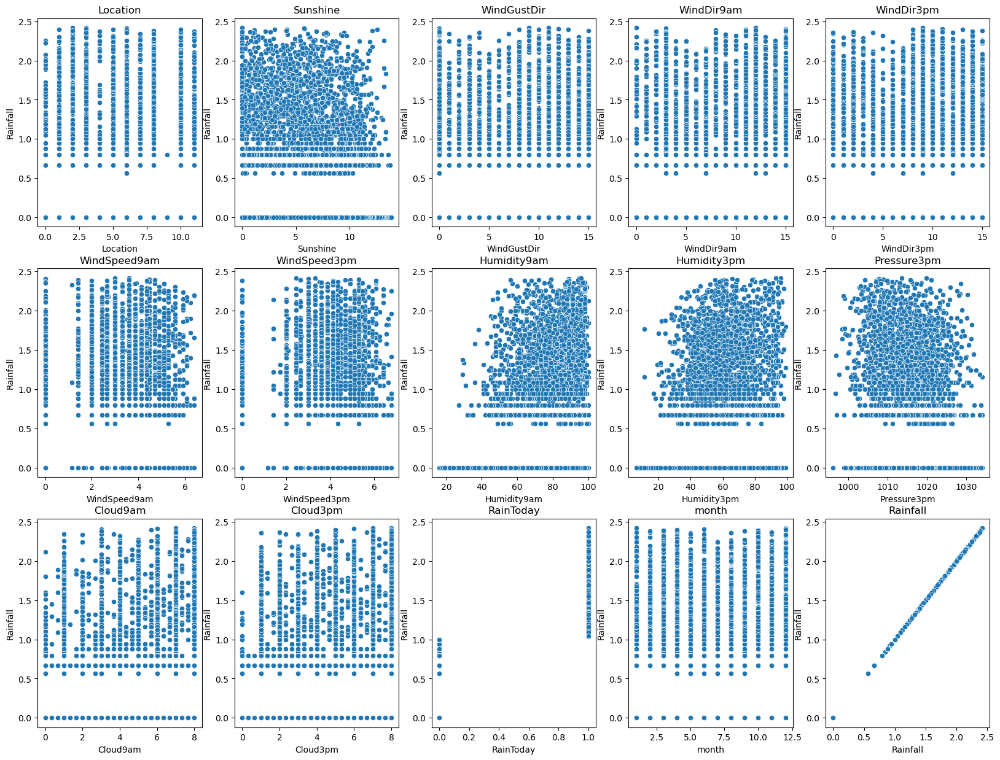

In [104]:
plt.figure(figsize=(20,15))
num =1
for i in col:
    if num<=len(col):
        ax=plt.subplot(3,5,num)
        sns.scatterplot(x=df[i],y=df["Rainfall"],data=df)
        plt.title(i)
        num +=1
plt.show()

In [105]:
yr = df.loc[:,"Rainfall"]
yr.head()

0    0.880112
1    0.000000
2    0.000000
3    0.000000
4    1.000000
Name: Rainfall, dtype: float64

**spliting data into train and test**

In [106]:
from sklearn.model_selection import train_test_split
xr_train,xr_test,yr_train,yr_test = train_test_split(x,yr,test_size=0.3,random_state=42)

In [107]:
print('xr_train:',xr_train.shape)
print('xr_test',xr_test.shape)
print('yr_train',yr_train.shape)
print('yr_test',yr_test.shape)

xr_train: (4378, 14)
xr_test (1877, 14)
yr_train (4378,)
yr_test (1877,)


### Model Bulding

In [108]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error

#### LinearRegression

In [109]:
lr = LinearRegression()
lr.fit(xr_train,yr_train)
print(lr.coef_)
print(lr.intercept_)

[ 1.30818992e-03 -7.08672480e-03 -9.91468688e-04  2.85113598e-03
  4.62043047e-03  4.50490791e-03  3.95246012e-03  3.78970128e-03
  1.04495686e-03 -3.06241941e-03  2.13878425e-03  1.42403139e-03
  1.34155146e+00  3.45741651e-04]
2.891854148142988


In [110]:
yr_train_pred = lr.predict(xr_train)
yr_test_pred = lr.predict(xr_test)

In [111]:
print("<-----------------train data----------------->")
print("r2_score:",r2_score(yr_train,yr_train_pred))
print("mean_absolute_error:",mean_absolute_error(yr_train,yr_train_pred))
print("mean_squared_error:",mean_squared_error(yr_train,yr_train_pred))

print("<-----------------test data----------------->")
print("r2_score:",r2_score(yr_test,yr_test_pred))
print("mean_absolute_error:",mean_absolute_error(yr_test,yr_test_pred))
print("mean_squared_error:",mean_squared_error(yr_test,yr_test_pred))

<-----------------train data----------------->
r2_score: 0.8224497998964988
mean_absolute_error: 0.2075467102893685
mean_squared_error: 0.0811436647630947
<-----------------test data----------------->
r2_score: 0.8380553632679653
mean_absolute_error: 0.19998115070751915
mean_squared_error: 0.07617388893010474


### RandomForestRegressor

In [112]:
from sklearn.ensemble import RandomForestRegressor

In [113]:
rf = RandomForestRegressor()
rf.fit(xr_train,yr_train)

RandomForestRegressor()

In [114]:
yr_train_pred = rf.predict(xr_train)
yr_test_pred = rf.predict(xr_test)

In [115]:
print("<-----------------train data----------------->")
print("r2_score:",r2_score(yr_train,yr_train_pred))
print("mean_absolute_error:",mean_absolute_error(yr_train,yr_train_pred))
print("mean_squared_error:",mean_squared_error(yr_train,yr_train_pred))

print("<-----------------test data----------------->")
print("r2_score:",r2_score(yr_test,yr_test_pred))
print("mean_absolute_error:",mean_absolute_error(yr_test,yr_test_pred))
print("mean_squared_error:",mean_squared_error(yr_test,yr_test_pred))

<-----------------train data----------------->
r2_score: 0.9744678668275453
mean_absolute_error: 0.07570826078915852
mean_squared_error: 0.011668648380146201
<-----------------test data----------------->
r2_score: 0.8357228322823096
mean_absolute_error: 0.197319074400946
mean_squared_error: 0.07727104138796209


### AdaBoostRegressor

In [116]:
from sklearn.ensemble import AdaBoostRegressor

In [117]:
Ada = AdaBoostRegressor()
Ada.fit(xr_train,yr_train)

AdaBoostRegressor()

In [118]:
yr_train_pred = Ada.predict(xr_train)
yr_test_pred = Ada.predict(xr_test)

In [119]:
print("<-----------------train data----------------->")
print("r2_score:",r2_score(yr_train,yr_train_pred))
print("mean_absolute_error:",mean_absolute_error(yr_train,yr_train_pred))
print("mean_squared_error:",mean_squared_error(yr_train,yr_train_pred))

print("<-----------------test data----------------->")
print("r2_score:",r2_score(yr_test,yr_test_pred))
print("mean_absolute_error:",mean_absolute_error(yr_test,yr_test_pred))
print("mean_squared_error:",mean_squared_error(yr_test,yr_test_pred))

<-----------------train data----------------->
r2_score: 0.8035242678870087
mean_absolute_error: 0.2608579362872121
mean_squared_error: 0.08979297647294396
<-----------------test data----------------->
r2_score: 0.811469538886732
mean_absolute_error: 0.25765769125163446
mean_squared_error: 0.0886790615273442


### GradientBoostingRegressor

In [120]:
from sklearn.ensemble import GradientBoostingRegressor

In [121]:
gbr = GradientBoostingRegressor()
gbr.fit(xr_train,yr_train)

GradientBoostingRegressor()

In [122]:
yr_train_pred = gbr.predict(xr_train)
yr_test_pred = gbr.predict(xr_test)

In [123]:
print("<-----------------train data----------------->")
print("r2_score:",r2_score(yr_train,yr_train_pred))
print("mean_absolute_error:",mean_absolute_error(yr_train,yr_train_pred))
print("mean_squared_error:",mean_squared_error(yr_train,yr_train_pred))

print("<-----------------test data----------------->")
print("r2_score:",r2_score(yr_test,yr_test_pred))
print("mean_absolute_error:",mean_absolute_error(yr_test,yr_test_pred))
print("mean_squared_error:",mean_squared_error(yr_test,yr_test_pred))

<-----------------train data----------------->
r2_score: 0.8528153624706503
mean_absolute_error: 0.18201270309325432
mean_squared_error: 0.0672660513984048
<-----------------test data----------------->
r2_score: 0.8431120442026931
mean_absolute_error: 0.1898678797893369
mean_squared_error: 0.07379537822638635


### knn

In [124]:
from sklearn.neighbors import KNeighborsRegressor

In [125]:
knn = KNeighborsRegressor()
knn.fit(xr_train,yr_train)

KNeighborsRegressor()

In [126]:
yr_train_pred = knn.predict(xr_train)
yr_test_pred = knn.predict(xr_test)

In [127]:
print("<-----------------train data----------------->")
print("r2_score:",r2_score(yr_train,yr_train_pred))
print("mean_absolute_error:",mean_absolute_error(yr_train,yr_train_pred))
print("mean_squared_error:",mean_squared_error(yr_train,yr_train_pred))

print("<-----------------test data----------------->")
print("r2_score:",r2_score(yr_test,yr_test_pred))
print("mean_absolute_error:",mean_absolute_error(yr_test,yr_test_pred))
print("mean_squared_error:",mean_squared_error(yr_test,yr_test_pred))

<-----------------train data----------------->
r2_score: 0.5246175901615802
mean_absolute_error: 0.3135764681893171
mean_squared_error: 0.21725839157440732
<-----------------test data----------------->
r2_score: 0.24734775159827183
mean_absolute_error: 0.400060967502349
mean_squared_error: 0.3540249923040877


#### XGBOOST

In [128]:
from xgboost import XGBRegressor

In [129]:
xgr = XGBRegressor()
xgr.fit(xr_train,yr_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [130]:
yr_train_pred = xgr.predict(xr_train)
yr_test_pred = xgr.predict(xr_test)

In [131]:
print("<-----------------train data----------------->")
print("r2_score:",r2_score(yr_train,yr_train_pred))
print("mean_absolute_error:",mean_absolute_error(yr_train,yr_train_pred))
print("mean_squared_error:",mean_squared_error(yr_train,yr_train_pred))

print("<-----------------test data----------------->")
print("r2_score:",r2_score(yr_test,yr_test_pred))
print("mean_absolute_error:",mean_absolute_error(yr_test,yr_test_pred))
print("mean_squared_error:",mean_squared_error(yr_test,yr_test_pred))

<-----------------train data----------------->
r2_score: 0.9849163054818573
mean_absolute_error: 0.05498844946776997
mean_squared_error: 0.006893522230082634
<-----------------test data----------------->
r2_score: 0.8096760115398958
mean_absolute_error: 0.20687300950646678
mean_squared_error: 0.08952268287639246


#### Final Model

#### gbc

In [132]:
param = {
    "loss" : ['squared_error', 'absolute_error', 'huber', 'quantile'],
    "learning_rate" : [0.1,0.5,1],
    "n_estimators" : [100,500,800,1000],
    "criterion" : ['friedman_mse', 'squared_error']
}

In [138]:
gbr_cv = GridSearchCV(estimator=gbr,param_grid=param,cv=3,scoring="r2",verbose=1)
gbr_cv.fit(xr_train,yr_train)

Fitting 3 folds for each of 96 candidates, totalling 288 fits


GridSearchCV(cv=3, estimator=GradientBoostingRegressor(),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'learning_rate': [0.1, 0.5, 1],
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile'],
                         'n_estimators': [100, 500, 800, 1000]},
             scoring='r2', verbose=1)

In [139]:
print(gbr_cv.best_params_)
print(gbr_cv.best_score_)

{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'squared_error', 'n_estimators': 100}
0.8221834381082839


In [140]:
yr_train_pred = gbr_cv.predict(xr_train)
yr_test_pred = gbr_cv.predict(xr_test)

In [141]:
print("<-----------------train data----------------->")
print("r2_score:",r2_score(yr_train,yr_train_pred))
print("mean_absolute_error:",mean_absolute_error(yr_train,yr_train_pred))
print("mean_squared_error:",mean_squared_error(yr_train,yr_train_pred))

print("<-----------------test data----------------->")
print("r2_score:",r2_score(yr_test,yr_test_pred))
print("mean_absolute_error:",mean_absolute_error(yr_test,yr_test_pred))
print("mean_squared_error:",mean_squared_error(yr_test,yr_test_pred))

<-----------------train data----------------->
r2_score: 0.8528153624706503
mean_absolute_error: 0.1820127030932543
mean_squared_error: 0.0672660513984048
<-----------------test data----------------->
r2_score: 0.8431542893132109
mean_absolute_error: 0.18983302742541203
mean_squared_error: 0.07377550739632147


#### Saving Model

In [142]:
import joblib

In [143]:
joblib.dump(gbr_cv,"Rainfall.obj")

['Rainfall.obj']

In [144]:
Rainfall = joblib.load("Rainfall.obj")

#### Pridection

In [149]:
input_val = (df.loc[:,x.columns]).sample(5)
input_val

,Location,Sunshine,WindGustDir,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,month
4177,5.0,7.100000,9.0,3.0,10.0,2.645751,3.872983,72.0,41.0,1007.4,3.000000,1.333333,1.0,2.0
4651,2.0,10.000000,0.0,12.0,2.0,2.000000,3.000000,73.0,43.0,1024.0,1.000000,2.000000,0.0,8.0
562,1.0,4.533333,6.0,0.0,0.0,2.000000,3.000000,91.0,73.0,1022.1,1.000000,7.000000,0.0,6.0
6108,8.0,9.100000,1.0,1.0,4.0,4.358899,4.358899,64.0,44.0,1015.1,1.000000,2.000000,0.0,6.0
3045,10.0,8.666667,7.0,7.0,10.0,5.291503,4.123106,62.0,52.0,1024.0,3.333333,5.333333,0.0,5.0


In [150]:
Rainfall.predict(input_val)

array([1.50083109, 0.07924931, 0.12205046, 0.00963373, 0.07019944])